## Control Recuperativo 2 INFO273. Redes de Colas
Utilice papel y lápiz para los desarrollos teóricos, les toma una foto y los incorpora como imagen en este notebook.
Para las partes que requieren cáculos matemáticos utilice código incrustado (en R o Python según sea su conveniencia).
Suba la carpeta comprimida con sus respuestas al espacio definido en siveducMD.

Considere el modelo de un sistema informático que consta de un procesador y dos unidades de disco magnético idénticas. Los trabajos del sistema siguen el comportamiento de un servidor central. Las razones de visita y los tiempos de servicio (en segundos) se detallan en la siguiente tabla:

$$\begin{array}{| c | c | c | c |}
\hline
\text{Nodo} & \text{Dispositivo} & \text{Tiempo medio} & \text{Tasa}  \\
&& \text{de servicio} & \text{de visitas} \\ \hline
1 & \text{Procesador (1)} & 0,01 & 25 \\
2 & \text{Disco A (2)} & 0,04 & 12 \\
3 & \text{Disco B (3)}& 0,04 & 12 \\ \hline
\end{array} $$

**(1)** Suponga  que el sistema es sometido a una carga transaccional, con una tasa llegadas de dos trabajos por segundo. Modele este sistema con una red de colas abierta y calcule:

**(a)**  Para cada nodo la utilización, número medio de trabajos y tiempo de respuesta. ¿Cuál es el tiempo de respuesta del sistema informático?

**(b)**  ¿Cuál es la productividad (tasa de proceso) máxima que soporta este sistema?

**(c)**  ¿Qué pasaría si se reemplazan los dos discos por uno nuevo con un tiempo de servicio de 0,03 segundos? ¿Cuál es el nuevo tiempo de respuesta?

**(2)**.  Suponga ahora que el sistema soporta una carga interactiva de 20 usuarios con un tiempo medio de reflexión de 3 segundos. Modele este sistema con una red de colas cerrada y calcule:

**(a)**  Para cada nodo la utilización, número medio de trabajos y tiempo de respuesta. ¿Cuál es el tiempo de respuesta del sistema informático?

**(b)**  Varie el número de clientes desde k=20 a 50 y grafique tasas de proceso. Interprete sus resultados. 

**(c)**  ¿Qué pasaría si se reemplazan los dos discos por uno nuevo con un tiempo de servicio de 0,03 segundos? Compare este resultado con el caso transaccional y justifique la diferencia existente.

# 1.  Suponga  que el sistema es sometido a una carga transaccional, con una tasa llegadas de dos trabajos por segundo. Modele este sistema con una red de colas abierta y calcule:

## 1.a Para cada nodo la utilización, número medio de trabajos y tiempo de respuesta. ¿Cuál es el tiempo de respuesta del sistema informático?

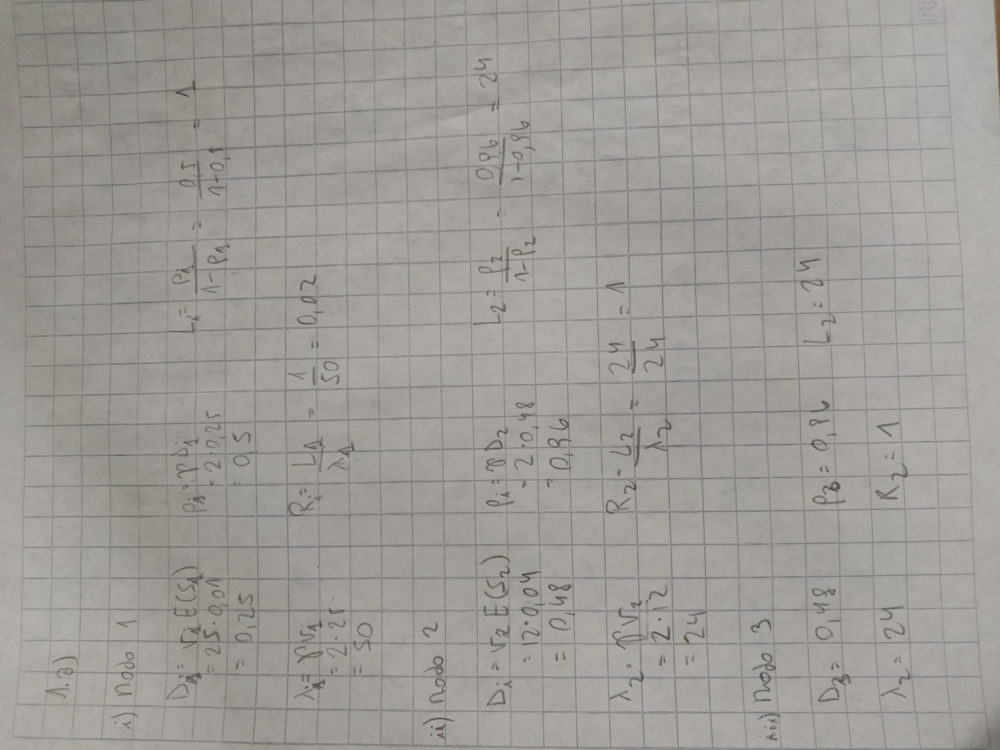

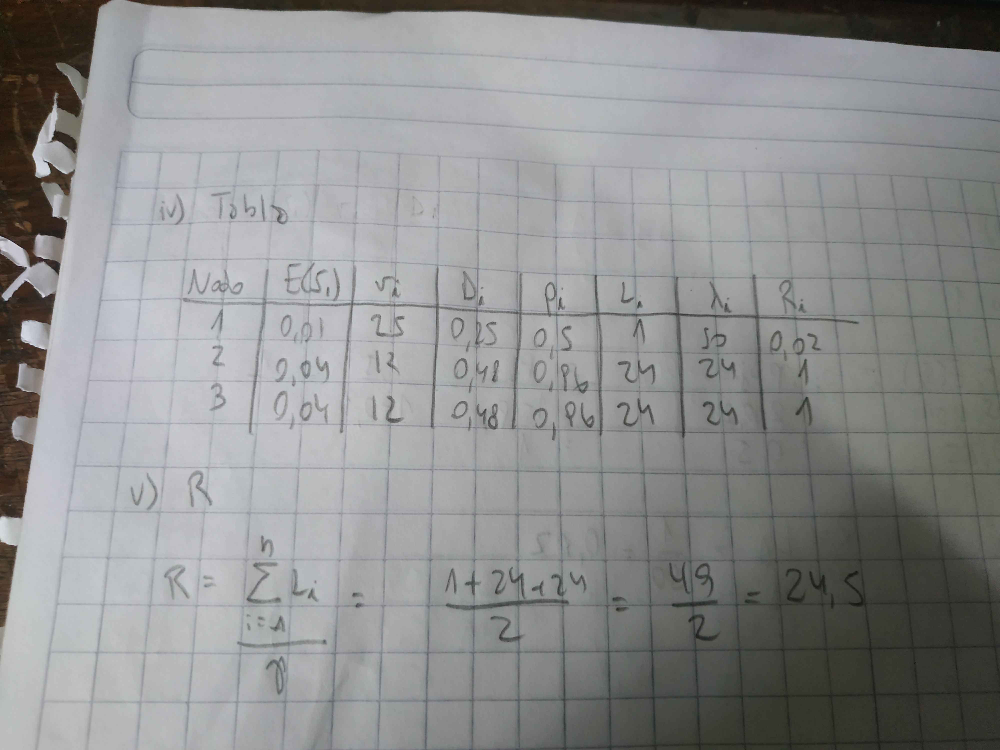

## 1.b ¿Cuál es la productividad (tasa de proceso) máxima que soporta este sistema?

## 1.c ¿Qué pasaría si se reemplazan los dos discos por uno nuevo con un tiempo de servicio de 0,03 segundos? ¿Cuál es el nuevo tiempo de respuesta?

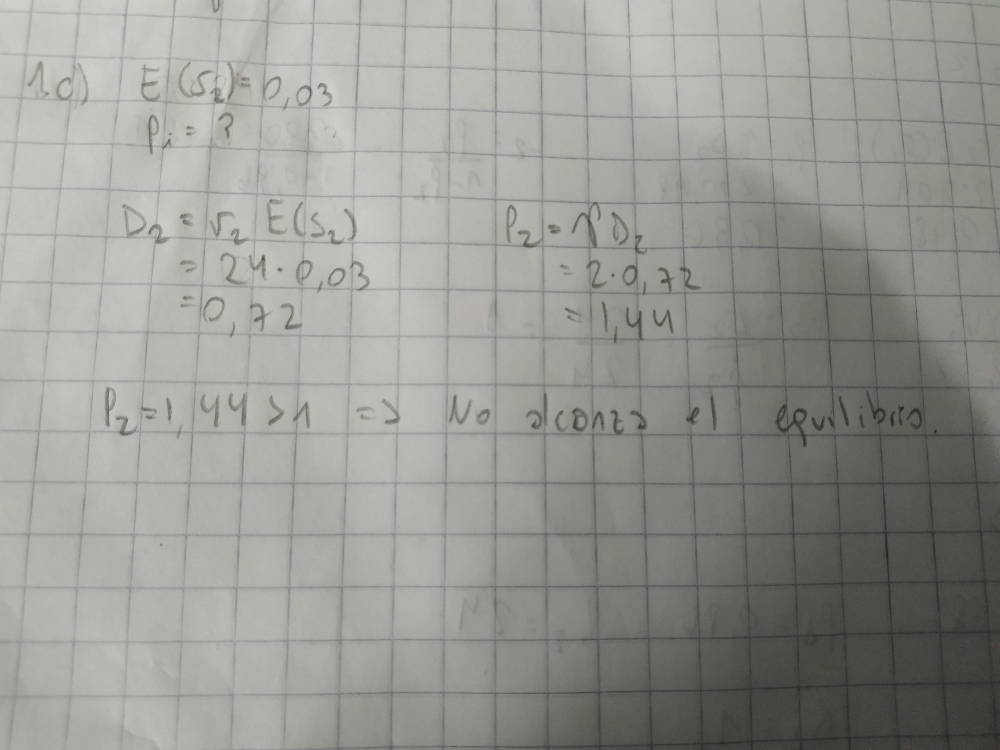

# 2. Suponga ahora que el sistema soporta una carga interactiva de 20 usuarios con un tiempo medio de reflexión de 3 segundos. Modele este sistema con una red de colas cerrada y calcule:

## 2.a Para cada nodo la utilización, número medio de trabajos y tiempo de respuesta. ¿Cuál es el tiempo de respuesta del sistema informático?

In [1]:
K=20
M=4
L <- rep(0,M)
R <- rep(0,M)
U <- rep(0,M)
u <- c(1/3,100,25,25)
v <- c(1,25,12,12)

prob <- matrix(1,nrow=K+1,ncol=M)
nprob <- matrix(1,nrow=K+1,ncol=M)

mu <- matrix(0,nrow=K,ncol=M)
mu[1,] <- u
for (k in 2:K){
    mu[k,]<- c(u[1]*k,u[2],u[3],u[4])
}

for (k in 1:K){   
    R <- rep(0,M)  
    for (j in 1:k){
        R <- R + (prob[j,]*rep(j,M)/mu[j,])
    }
    T <- k/(t(v)%*%R)
    L <- rep(0,M)
    sum <- rep(0,M)
    for (j in 1:k){
        nprob[j+1,] <- rep(T,M)*(v/mu[j,])*prob[j,]
        sum <- sum + nprob[j+1,]
        L <- L + rep(j,M)*nprob[j+1,]
    }
    U <- sum
    nprob[1,] <- rep(1,M) - U
    prob <- nprob  
}
print(T)
des_nodo = rbind(L,U,R)
print(des_nodo)
tiempo_med_resp = sum(L)/T

print(tiempo_med_resp)

         [,1]
[1,] 1.930912
       [,1]       [,2]      [,3]      [,4]
L 5.7927354 0.92124592 6.6430094 6.6430094
U 0.9971866 0.48272795 0.9268377 0.9268377
R 3.0000000 0.01908416 0.2866957 0.2866957
        [,1]
[1,] 10.3578


## 2.b Varie el número de clientes desde k=20 a 50 y grafique tasas de proceso. Interprete sus resultados

[1] 0.9977932 0.5089049 0.9770973 0.9770973


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
  0.000   0.000   1.975   1.241   2.017   2.036 

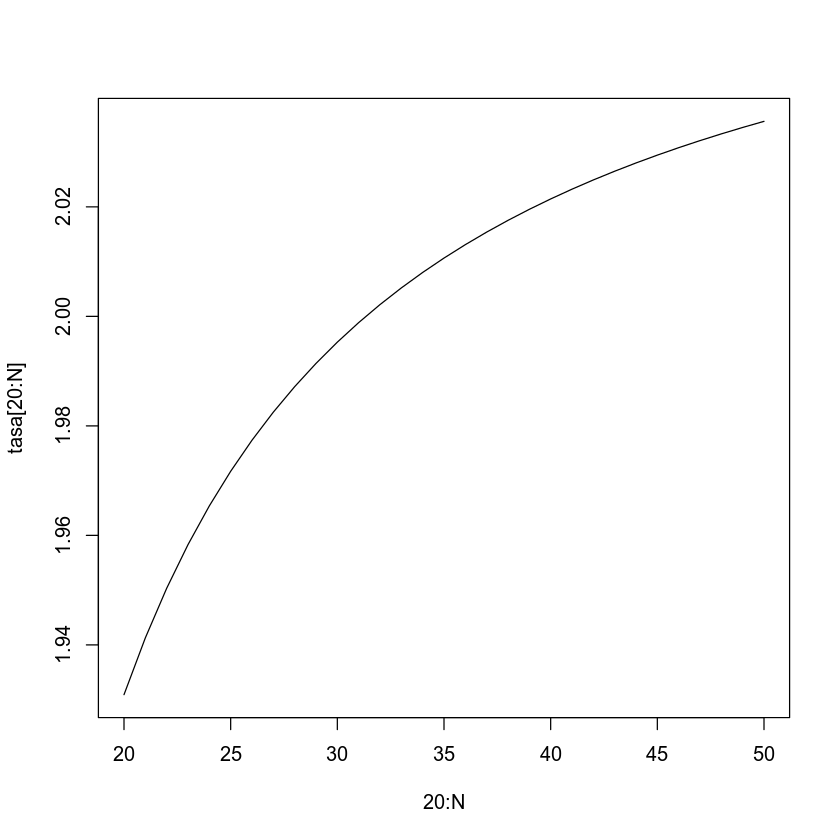

In [5]:
N=50
tasa <- rep(0,N)
for (K in 20:N){
    M=4
    L <- rep(0,M)
    R <- rep(0,M)
    U <- rep(0,M)
    u <- c(1/3,100,25,25)
    v <- c(1,25,12,12)
    
    prob <- matrix(1,nrow=K+1,ncol=M)
    nprob <- matrix(1,nrow=K+1,ncol=M)
    
    mu <- matrix(0,nrow=K,ncol=M)
    mu[1,] <- u
    for (k in 2:K){
        mu[k,]<- c(u[1]*k,u[2],u[3],u[4])
    }

    for (k in 1:K){   
        R <- rep(0,M)  
        for (j in 1:k){
            R <- R + (prob[j,]*rep(j,M)/mu[j,])
        }
        T <- k/(t(v)%*%R)
        L <- rep(0,M)
        sum <- rep(0,M)
        for (j in 1:k){
            nprob[j+1,] <- rep(T,M)*(v/mu[j,])*prob[j,]
            sum <- sum + nprob[j+1,]
            L <- L + rep(j,M)*nprob[j+1,]
        }
        U <- sum
        nprob[1,] <- rep(1,M) - U
        prob <- nprob  
    }

    tasa[K] = T
}
plot(20:N,tasa[20:N],type="l")
print(U)
summary(tasa)

R: Como se puede apreciar, la tasa de proceso del sistema tiene una cota en $2.036$, la cuál indica que los discos podrían llegar a la saturación con 50 clientes.

## 2.c ¿Qué pasaría si se reemplazan los dos discos por uno nuevo con un tiempo de servicio de 0,03 segundos? Compare este resultado con el caso transaccional y justifique la diferencia existente.

In [7]:
K=20
M=3

L <- rep(0,M)
R <- rep(0,M)
U <- rep(0,M)
u <- c(1/3,100,33.33)
v <- c(1,25,24)

prob <- matrix(1,nrow=K+1,ncol=M)
nprob <- matrix(1,nrow=K+1,ncol=M)

mu <- matrix(0,nrow=K,ncol=M)
mu[1,] <- u
for (k in 2:K){
    mu[k,]<- c(u[1]*k,u[2],u[3])
}

for (k in 1:K){   
    R <- rep(0,M)  
    for (j in 1:k){
        R <- R + (prob[j,]*rep(j,M)/mu[j,])
    }
    T <- k/(t(v)%*%R)
    L <- rep(0,M)
    sum <- rep(0,M)
    for (j in 1:k){
        nprob[j+1,] <- rep(T,M)*(v/mu[j,])*prob[j,]
        sum <- sum + nprob[j+1,]
        L <- L + rep(j,M)*nprob[j+1,]
    }
    U <- sum
    nprob[1,] <- rep(1,M) - U
    prob <- nprob  
}

print(rbind(L,U,R))
print(T)

       [,1]      [,2]       [,3]
L 4.1662456 0.5318283 15.3019261
U 0.9844897 0.3471871  0.9999989
R 3.0000000 0.0153182  0.4591042
         [,1]
[1,] 1.388749
